# Assignment #4 - Reinforcement Learning

### <font color="red"> DUE: Nov 26 (Tuesday) 11:00 pm </font>  

<font color="blue"> Amit Shetty </font>

# I. Overview

Describe the objective of this assignment. You can briefly state how you accompilsh it.

The objective of this assignment is to understand how Reinforcement Learning works. Reinforcement Learning (RL) is a type of machine learning technique that enables an agent to learn in an interactive environment by trial and error using feedback from its own actions and experiences. Though both supervised and reinforcement learning use mapping between input and output, unlike supervised learning where the feedback provided to the agent is correct set of actions for performing a task, reinforcement learning uses rewards and punishments as signals for positive and negative behavior.

In order to understand how Reinforcement Learning works, I will be demonstrating how turn-based card games can be taught to an agent and how its decisions can be based on the outcome of the turn. By rewarding good moves and penalizing bad moves, the program can effectively build an agent which uses the model to determine the best move and ignore the bad ones. This will start as a trial and error game and go onto provide better results.

# II. Problems 



## Rummy (Our Way)
![](https://upload.wikimedia.org/wikipedia/commons/9/9a/3_playing_cards.jpg)



### Description:
Rummy is mostly played by 4 players where each player get 10 cards and rest of placed as closed deck.  

But for this assignment to keep it simple, we have changed some rules, reduced the deck of cards and distribution of the cards among each player. Otherwise, the our Q table would be large to handle on our local machines.  

So in this game each player will get 3 cards randomly from 'A' to '5'. With each turn you have to pick a card either from the pile of closed or open cards depending on the cards you have. After that you have to select a card to drop to the pile from your deck. Your goal is to make all of your 3 cards of same number. As soon as one player reaches the goal state, it will meld the cards and game will stop and all other player will get score as the sum of their cards in hand. Player with minimum score will win the game.  

Each player will play for the 10 rounds and if nobody reach to the meld stage then each will player will get score equivalent to the sum of their cards in hand.

Player with the lowest score wins the game.



### <font color="red"> Game Introduction and Rules: </font>

You can only till max turns which is now 20. If you are able to meld your cards, you win otherwise you lose points as per your stash score.

Lets Simulate a Game Round :
The Goal of this game is to collect cards with the same rank.
Naming Conventions to follow H : Hearts, S : Spades, D : Diamonds, C : Clubs. Stash/Hand are the cards which you have. Stash/Hand Score: The sum of the rank of cards. 

- On the first turn you will be given 3 cards from the randomly shuffled deck. Eg: 3H, 2S, AD. Stash Score: 6
- In the next step you will have to either pick a card from pile or the deck. On the first turn, the top card of the deck is on the pile. The card on the pile is visible to you. So Card on the Pile : 2D . You have to decide whether you have to pick this card or you have to pick from pile. Since you alread
- Following the pickup step, you will have to drop one card from the stash/hand. Your Hand : 3H, 2S, AD, 2D
- You can drop any of these cards, but remember if you drop 2S or 2D you might not be able to make a series. So you have to decide whether to drop 3H or AD. Since there are maximum 20 turns, you have to keep your score low as well, Higher the score the higher points you lose. So you decide to drop 3H. Your hand/stash will be: 2S, 2D, AD
- Your opponent will play his hand, he/she shall pick up a card from a pile or deck and the drop a card to the pile.
- Now its your turn. The card on the Pile : 5H. Since picking up this card won't help you much. You decide to pick a card from the Deck. You get lucky, you get a 2C card. Your hand now is 2S, 2D, 2C, AD. Hurray! You can now meld these cards and drop the last card to make your score 0.
- You win this round. Your opponent Stash/Hand score : 15. So you are at 0 points and your opponent is at 15 points. You are ahead of him since you have to keep your score as low as possible.


## Rummy Environment

Importing Libraries

In [1]:
import random 
from functools import reduce
from collections import defaultdict
import numpy as np
from copy import copy
import matplotlib.pyplot as plt
%matplotlib inline

Here, we define the SUITS, RANKS of the cards and their RANK_VALUE.

In [2]:
SUIT = ['H','S','D','C']
RANK = ['A', '2', '3', '4', '5','6','7']
RANK_VALUE = {'A': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'T': 10, 'Q': 10, 'K': 10}

## Card Class Definition
__init__  : Defines the card details such as rank, suit and calculates the rank value


In [3]:
class Card :
    def __init__(self,rank,suit):
        self.rank = rank
        self.suit = suit
        self.rank_to_val = RANK_VALUE[self.rank]
    
    def __str__(self):
        return f'{self.rank}{self.suit}'

    def __repr__(self):
        return f'{self.rank}{self.suit}'

    
    def __eq__(self,other):
        return self.rank == other.rank and self.suit == other.suit
  
# Deck class contains some basic operations performed with the cards:
# 1. Shuffling the cards.
# 2. Drawing card from the deck.

## Deck Class Definition
__shuffle__ : Shuffles the deck in random order

__draw_card__ : Draws a card from the top of the deck

In [4]:
class Deck:
    def __init__(self,packs):
        self.packs = packs
        self.cards = []
        for pack in range(0,packs) :
            for suit in SUIT :
                for rank in RANK :
                    self.cards.append(Card(rank,suit))
    
    def shuffle(self):
        random.shuffle(self.cards)
    
    def draw_card(self):
        card = self.cards[0]
        self.cards.pop(0)
        return card

## Player Class:

### 1.__init__(self,name,stash=list(),isBot=False): 
Initializing stash, name, isBot/dealer points for each player.

### 2. deal_card(self,card):
This method appends the card in the stash and check the condition that length of stash should not be greater than nuber of cards length in game.

### 3. drop_card(self,card):
This method removes the card from stash and add that card into pile.

### 4. meld(self):
This method tries to find the cards with the same rank in the hand. If it finds then it will merge the cards in the hand to the melded cards array in the game. 

### 5. stash_score(self):
This method calculates sum of all the cards in stash according to the rank of each card.

### 6. get_info(self,debug):
This function fetch all the information of the player.

In [5]:
class Player:
  
    """  
        Player class to create a player object.
        eg: player = Player("player1", list(), isBot = False)
        Above declaration will be for your agent.
        All the player names should be unique or else you will get error.
        
    """

    def __init__(self,name,stash=list(),isBot=False,points=0,conn=None):
        self.stash = stash
        self.name = name
        self.game = None
        self.isBot = isBot
        self.points = points
        self.conn = conn
        
    def deal_card(self,card):
        try :
            self.stash.append(card)
            if len(stash) > self.game.cardsLength + 1 :
                raise ValueError('Cannot have cards greater than ')
        except ValueError as err:
            print(err.args)
            
    def drop_card(self,card):
        self.stash.remove(card)
        self.game.add_pile(card)
        return -1

    
    def meld(self):
        card_hash = defaultdict(list)
        for card in self.stash:
            card_hash[card.rank].append(card)
        melded_card_ranks = []
        for (card_rank,meld_cards) in card_hash.items():
            if len(meld_cards) >= 3 :
                self.game.meld.append(meld_cards)
                melded_card_ranks.append(card_rank)
                for card in meld_cards:
                    self.stash.remove(card)
        
        for card_rank in melded_card_ranks :
            card_hash.pop(card_rank)
        return len(melded_card_ranks) > 0

    def stash_score(self) :
        score = 0
        for card in self.stash :
            score += RANK_VALUE[card.rank]
        return score
    
    def get_info(self,debug=False):
        if debug :
            print(f'Player Name : {self.name} \n Stash Score: {self.stash_score()} \n Stash : {", ".join(str(x) for x in self.stash)}')
        card_ranks = []
        card_suits = []
        pileset = None
        pile = None
        for card in self.stash :
            card_suits.append(RANK_VALUE[card.rank])
            card_ranks.append(card.suit)
        if len(self.game.pile) > 0 : 
            return {"Stash Score" : self.stash_score(), "CardSuit":  card_suits, "CardRanks": card_ranks, "PileRank": self.game.pile[-1].rank, "PileSuit":self.game.pile[-1].suit}
        return {"Stash Score" : self.stash_score(), "CardSuit":  card_suits, "CardRanks": card_ranks}


## Game Enviroment:

### 1. __init():  

### 2. add_pile(self, card):  This method takes a card as argument and first checks number of cards in the deck. If its is ‘0’ then add the cards from file to deck and append the passed card to the pile.

### 3. pick_card(self, player, action):  This methods helps player picking up the card from either Pile or Deck based on action.
			We have defined, If action = 0 then, player will pick a card from Pile
			And if action. = 1 then player will pick card from Deck. 
			Meld condition will be check after player picks the card, if the meld condition satisfied, player won. 
            You can modify the rewards in return, only the values

### 4. pick_from_pile(self, player): This method helps player picking card from the pile and simultaneously a card from pile gets reduced.

### 5. pick_from_deck(self, player): This method is similar to above method but it helps picking up card from the Deck. 

### 6. get_player(self, player_name): This function fetch the details of the player given player_name.

### 7. computer_play(self, player): This method defines the play of the computer/Dealer in following sequence:
			--> Randomly taking actions from picking up card from deck/pile.
			--> Checking the meld condition afterwards.
			--> If the meld condition does not satisfied, remove the card from his stash.

### 8. play(self): This method defines all the function city of play for the player:
		  --> Decrementing the maximum number of turns defined per game.
		  --> For each player, it will check the 'stash', if the 'Stash' for any player = 0 (That player won), it will add the value of each card in stash for all other players.
		  --> Or If maximum number of turns in each round becomes 0, it will add the card values in stash for all the players and return.
      
### 9. drop_card(self,player,card) This method drops a card from the player given player object and card object and returns the reward associated with it.

      --> You can modify the rewards which gets returned in the value.


### 9. reset(self, players): This method will reinitialize all the deck, pile and players.

### 10. _update_turn(self): This method is used to count the number of turns in the game.

In [6]:
class RummyAgent() :
    """
    Simple Rummy Environment
    
    Simple Rummy is a game where you need to make all the cards in your hand same before your opponent does.
    Here you are given 3 cards in your hand/stash to play.
    For the first move you have to pick a card from the deck or from the pile. 
    The card in deck would be random but you can see the card from the pile.
    In the next move you will have to drop a card from your hand.
    Your goal is to collect all the cards of the same rank. 
    Higher the rank of the card, the higher points you lose in the game. 
    You need to keep the stash score low. Eg, if you can AH,7S,5D your strategy would be to either find the first pair of the card or by removing the highest card in the deck.
    You only have 20 turns to either win the same or collect low scoring card.
    You can't see other players cards or their stash scores.
    
    Parameters
    ====
    players: Player objects which will play the game.
    max_card_length : Number of cards each player can have
    max_turns: Number of turns in a rummy game
    """

    def __init__(self,players,max_card_length=3,max_turns=20) :
        self.max_card_length = max_card_length
        self.max_turns = max_turns
        self.reset(players)
        
    def update_player_cards(self,players):
        for player in players :
            player = Player(player.name,list(),isBot=player.isBot,points=player.points,conn=player.conn)
            stash = []
            for i in range(self.max_card_length):
                player.stash.append(self.deck.draw_card())
            player.game = self
            self.players.append(player)
        self.pile = [self.deck.draw_card()]

    def add_pile(self,card):
        if len(self.deck.cards) == 0 :
            self.deck.cards.extend(self.pile)
            self.deck.shuffle()
            self.pile = []
        self.pile.append(card)
        
        
    def pick_card(self,player,action):
        if action == 0:
            self.pick_from_pile(player)
        else :
            self.pick_from_deck(player)
        if player.meld() :
            return {"reward" : 10}
        else :
            return {"reward" : -1}
#             return -player.stash_score()
       
    def pick_from_pile(self,player):
        card = self.pile[-1]
        self.pile.pop()
        return player.stash.append(card)
     
    def pick_from_deck(self,player):
        return player.stash.append(self.deck.draw_card())
    
    def get_player(self,player_name):
        return_player = [player for player in self.players if player.name == player_name]
        if len(return_player) != 1:
            print("Invalid Player")
            return None
        else:
            return return_player[0]
    
    def drop_card(self,player,card):
        player.drop_card(card)
        return {"reward" : -1}
    
  
    def computer_play(self,player):
        #Gets a card from deck or pile
        if random.randint(0,1) == 1 :
            self.pick_from_pile(player)
        else :
            self.pick_from_deck(player)
            
        #tries to meld if it can
#         if random.randint(0,10) > 5 :
        player.meld()
        
        #removes a card from the stash
        if len(player.stash) != 0:
            card = player.stash[(random.randint(0,len(player.stash) - 1))]
            player.drop_card(card)
        
    def play(self):
        for player in self.players :
            if len(player.stash) == 0 :
                return True
        if self.max_turns <= 0 :
            return True
        return False

    def _update_turn(self):
        self.max_turns -= 1  
    
    def reset(self,players,max_turns=20):
        self.players = []
        self.deck = Deck(1)
        self.deck.shuffle()
        self.meld = []
        self.pile = []
        self.max_turns = max_turns
        self.update_player_cards(players)


### Example Run with Random Players

This following code shows how to create an environment and players to play 10 games with 20 maximum rounds. This only includes random picking up of card and dropping.  

In [7]:
p1 = Player('tabish',list())
p2 = Player('comp1',list(),isBot=True)
rummy = RummyAgent([p1,p2],max_card_length=3,max_turns=20)

In [8]:
maxiter = 3
debug = True
for j in range(maxiter):
        for player in rummy.players :
            player.points = player.stash_score()
        
        rummy.reset(rummy.players)
        random.shuffle(rummy.players)
        # int i = 0 
        if debug :
            print(f'**********************************\n\t\tGame Starts : {j}\n***********************************')
        while not rummy.play() :    
            rummy._update_turn()
            print(rummy.max_turns)       
            for player in rummy.players:
                if player.isBot :
                    if rummy.play():
                        continue
                    if debug :
                        print(f'{player.name} Plays')
                    rummy.computer_play(player)
                    if debug :
                        player.get_info(debug)
                        if player.stash == 0 :
                            print(f'{player.name} wins the round')

                else :
                    if rummy.play() :
                        continue
                    if debug :
                        print(f'{player.name} Plays')
                    player_info = player.get_info(debug)
                    action_taken = np.random.choice(1)
                    if debug :
                        print(f'Card in pile {player_info["PileSuit"]}{player_info["PileRank"]}')
                    result_1 = rummy.pick_card(player,action_taken)
                    result_1 = result_1["reward"]

                    if debug : 
                        print(f'{player.name} takes action {action_taken}')
                    #player stash will have no cards if the player has melded them 
                    #When you have picked up a card and you have drop it since the remaining cards have been melded. 
                    if len(player.stash) == 1:
                        rummy.drop_card(player,player.stash[0])
                        if debug :
                            print(f'{player.name} Wins the round')

                    elif len(player.stash) != 0 :

                        player_info = player.get_info(debug)
                        s = player_info['CardRanks']
                        action_taken = np.random.choice(4)
                        card = player.stash[action_taken]
                        if debug :
                            print(f'{player.name} drops card {card}')

                        result_1 = rummy.drop_card(player,card)
                        result_1 = result_1["reward"]
#                             pdb.set_trace()
                    else :
                        if debug :
                            print(f'{player.name} Wins the round')
                    if debug :
                        player.get_info(debug)
        


**********************************
		Game Starts : 0
***********************************
19
comp1 Plays
Player Name : comp1 
 Stash Score: 11 
 Stash : AD, 4S, 6D
tabish Plays
Player Name : tabish 
 Stash Score: 13 
 Stash : 4H, 4C, 5S
Card in pile C3
tabish takes action 0
Player Name : tabish 
 Stash Score: 16 
 Stash : 4H, 4C, 5S, 3C
tabish drops card 3C
Player Name : tabish 
 Stash Score: 13 
 Stash : 4H, 4C, 5S
18
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : AD, 4S, 5D
tabish Plays
Player Name : tabish 
 Stash Score: 13 
 Stash : 4H, 4C, 5S
Card in pile D6
tabish takes action 0
Player Name : tabish 
 Stash Score: 19 
 Stash : 4H, 4C, 5S, 6D
tabish drops card 4C
Player Name : tabish 
 Stash Score: 15 
 Stash : 4H, 5S, 6D
17
comp1 Plays
Player Name : comp1 
 Stash Score: 10 
 Stash : AD, 5D, 4C
tabish Plays
Player Name : tabish 
 Stash Score: 15 
 Stash : 4H, 5S, 6D
Card in pile S4
tabish takes action 0
Player Name : tabish 
 Stash Score: 19 
 Stash : 4H, 5S, 6D, 4S
ta

# III. Methods

- Decide your TD learning approach: SARSA or Q-learning? 
- Decide your function approximator.
- Describe your approach and the reason why you select it.
- Finish epsilon_greedy function and other TODOs. Explain it.
- Explain your codes.

### QLearning

Q-Learning is an off-policy, model-free RL algorithm based on the well-known Bellman Equation.
E in the above equation refers to the expectation, while ƛ refers to the discount factor. We can re-write it in the form of Q-value:

$$
v(s) = E[R_{t+1} + \lambda v(S_{t+1})| S_t = S]
$$

Bellman Equation In Q-value Form. The optimal Q-value, can be expressed as:

$$
    Q(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha ( R_{t+1} + \gamma \max_a Q(s_{t+1}, a) - Q(s_t, a_t)) 
$$

The goal is to maximize the Q-value. Before diving into the method to optimize Q-value, I would like to discuss two value update methods that are closely related to Q-learning.

The algorithm used in Q Learning is as follows:

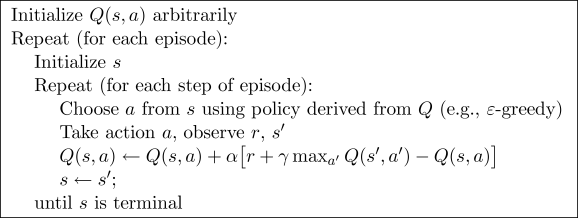</img>

### State-Action-Reward-State-Reaction

SARSA very much resembles Q-learning. The key difference between SARSA and Q-learning is that SARSA is an on-policy algorithm. It implies that SARSA learns the Q-value based on the action performed by the current policy instead of the greedy policy.
The action a_(t+1) is the action performed in the next state s_(t+1) under current policy.
SARSA technique, is an On Policy and uses the action performed by the current policy to learn the Q-value.

$$
    Q(s_t, a_t) \leftarrow Q(s_t, a_t) + \alpha ( R_{t+1} + \gamma Q(s_{t+1}, a_{t+1}) - Q(s_t, a_t)) 
$$

Here, the update equation for SARSA depends on the current state, current action, reward obtained, next state and next action. This observation lead to the naming of the learning technique as SARSA stands for State Action Reward State Action which symbolizes the tuple (s, a, r, s’, a’).

The algorithm for SARSA can be written as follows:

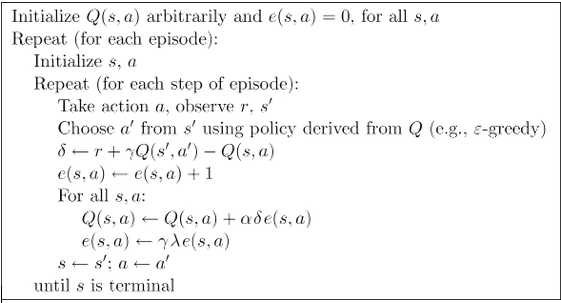</img>

#### Strategy Chosen for Game

I will be using Q learning for this assignment as the Qtable data structure is easy to maintain and lookup for potential combination of cards. One of the disadvantages of using this approach however is that when training for a long time the data structure can grow extremely large making it difficult to keep in memory and do a lookup. However, it is much easier to implement than function approximation.

#### Greedy approach used

In the Q table approach I am using a function that will find the maximum Q function value calculated for a certain observation. By selecting the maximum value for a Q function observation, we are deciding to follow the path of exploitation rather than observation.

## RLAgent for Rummy

Referencing the RLAgent in the lecture note, make your own agent class for the game. 

class RummyGameAgent

1. init
Initialises all the variables for the class including the hyperparameters


2. create_new_qtable_from_observation
This will create a new QTable for the observations we see. The observation is divided in to 2 parts. An observation that has a string at the end is where the player has 3 cards in hand and 1 on the pile. The 2nd part is where the player has 4 cards in hand which is indicated by the observation having all integers which indicates the player having picked the card from the pile or deck.


3. update_parameters
This will updates the hyperparameters as the action are decided from the qtable


4. maintain_win_counter
This methods keep track of 2 counters which determine how many time the player, computer or no one won.


5. greedy_func_Qtable
The greedy function decides the maximum Q value function from the decisions and implements it.


6. log_rewards_for_players_2
Tracks all the rewards given to the player and the computer for later logging to the plots


7. reduce_function_gameplay
This function is called at the start of the training phase for the Q function attributes to be incremented or modified based on how the game progresses


8. action_decider
This function is where the agent will lookup the Qtable to decide on what action to take during the game for the player


9. learning_from_Qtable
This is the actual Q table function that is used to calculate the probability of an action to be taken


10. training_agent
The funciton that is called to train the agent for a certain number of games which is configurable. The card game is fixed to 20 games per round.

NOTE: debug flag can be set to True for in this method but the large number of print statements will cause an IO Overflow in the notebook is trainined for a sufficiently long period.


11. testing_agent

Exactly the same structure as the training agent except that the Q tablw will no longer be updated

In [9]:
class RummyGameAgent:
    
    def __init__(self, env, no_of_games_to_play=10, alpha=0.5,epsilon=1.0, gamma=0.9):
        self.env=env
        self.no_of_games_to_play = no_of_games_to_play
        self.Qtable = dict()
        self.alpha = alpha
        self.epsilon = epsilon         
        self.gamma = gamma      
        self.valid_actions = [0, 1]
        self.valid_actions_for_drop = [0, 1, 2, 3]
        self.count_player_wins = 0
        self.count_comp_wins = 0
        self.count_no_wins = 0
        self.rewards_list_player = []
        self.rewards_list_comp = []
        self.rewards_list_player_test = []
        self.rewards_list_comp_test = []
        
    def create_new_qtable_from_observation(self, observation):
        if observation not in self.Qtable and len(observation) > 0:
            if isinstance(observation[-1], str):
                self.Qtable[observation] = dict((action, 0.0) for action in self.valid_actions)
            else:
                self.Qtable[observation] = dict((action, 0.0) for action in self.valid_actions_for_drop)
            
    def update_parameters(self):
        if self.num_episodes_to_train_left > 0.7 * self.no_of_games_to_play:
            self.epsilon -= self.small_decrement
        elif self.num_episodes_to_train_left > 0.3 * self.no_of_games_to_play:
            self.epsilon -= self.big_decrement
        elif self.num_episodes_to_train_left > 0:
            self.epsilon -= self.small_decrement
        else:
            self.alpha = 0.0
            self.epsilon = 0.0
        self.num_episodes_to_train_left -= 1
        
    def maintain_win_counter(self, winner):
        if winner == "amit":
            self.count_player_wins += 1
        elif winner == "comp":
            self.count_comp_wins += 1
            
    def greedy_func_Qtable(self, observation):
        self.create_new_qtable_from_observation(observation)
        greedy_max_value = max(self.Qtable[observation].values())
        return greedy_max_value if not greedy_max_value else 0
    
    def log_rewards_for_players(self, player, log_result_player, log_result_comp):
        if player.name == "amit":
            log_result_player += 1
        else:
            log_result_comp += 1
        return log_result_player, log_result_comp
    
    def log_rewards_for_players_2(self, player, rewards, flag):
        if flag == "train":
            if player.name == "amit":
                self.rewards_list_player.append(rewards)
            else:
                self.rewards_list_comp.append(rewards)
        else:
            if player.name == "amit":
                self.rewards_list_player_test.append(rewards)
            else:
                self.rewards_list_comp_test.append(rewards)
    
    def reduce_function_gameplay(self):
        self.small_decrement = (0.1 * self.epsilon) / (0.3 * self.no_of_games_to_play)
        self.big_decrement = (0.8 * self.epsilon) / (0.4 * self.no_of_games_to_play)
        self.num_episodes_to_train_left = self.no_of_games_to_play
    
    def action_decider(self, observation):
        self.create_new_qtable_from_observation(observation)
        if random.random() > self.epsilon:
            maxQ = self.greedy_func_Qtable(observation)
            action = random.choice([k for k in self.Qtable[observation].keys()
                                    if self.Qtable[observation][k] == maxQ])
        else:
            action = random.choice(self.valid_actions)
        self.update_parameters()
        return action
        
    def learning_from_Qtable(self, observation, observation1, action, reward):
        debug = False
        if debug:
            self.Qtable[observation][action] += self.alpha * (reward
                                        + (self.gamma * self.greedy_func_Qtable(observation1))
                                              - self.Qtable[observation][action])
    
    def training_agent(self):
        debug=False
        self.reduce_function_gameplay()
        for turn in range(self.no_of_games_to_play):
            print("<=== PLAYING ROUND {} ===>".format(turn+1))
            for player in self.env.players :
                player.points = player.stash_score()
        
            self.env.reset(self.env.players)
            random.shuffle(self.env.players)
            log_result_player=0
            log_result_comp = 0
            if debug :
                print(f'**********************************\n\t\tGame Starts : {turn}\n***********************************')
            while not self.env.play() :    
                self.env._update_turn()
                print("max Turns ==> ", self.env.max_turns)       
                for player in self.env.players:
                    if player.isBot :
                        if self.env.play():
                            continue
                        if debug :
                            print(f'{player.name} Plays')
                        self.env.computer_play(player)
                        if debug :
                            player.get_info(debug)
                        if player.stash == 0 or len(player.stash) == 1:
                            print(f'{player.name} wins the round')
                    else :
                        if self.env.play() :
                            continue
                        if debug :
                            print(f'{player.name} Plays')
                        player_info = player.get_info(debug)
                        # action_taken = np.random.choice(1)
                        # observation = sorted(player.get_info().get("CardSuit"))
                        observation = player.get_info().get("CardSuit")
                        observation.append(player.get_info().get("PileRank"))
                        if debug: 
                            print("<== Observation ==> ", observation)
                        # print("test this", self.env.players[0].get_info().get("PileRank"))
                        action_taken = self.action_decider(tuple(observation))
                        if debug :
                            print(f'Card in pile {player_info["PileRank"]}{player_info["PileSuit"]}')
                        result_1 = self.env.pick_card(player,action_taken)
                        # This will have 4 cards (all integers)
                        observation1 = player.get_info().get("CardSuit")
                        observation1 = sorted(observation1)
                        if debug: 
                            print("<== Observation1 ==> ", observation1)
                        result_1 = result_1["reward"]
                        self.log_rewards_for_players_2(player, result_1, flag = "train")
                        # print("result1 ==> ", result_1)
                        self.learning_from_Qtable(tuple(observation), tuple(observation1), action_taken, result_1)
                        # print(self.env.players[0].get_info())
                        if debug : 
                            print(f'{player.name} takes action {action_taken}')
                        #player stash will have no cards if the player has melded them 
                        #When you have picked up a card and you have drop it since the remaining cards have been melded. 
                        if len(player.stash) == 1:
                            self.env.drop_card(player,player.stash[0])
                            print(f'{player.name} Wins the round')
                            self.maintain_win_counter(player.name)

                        elif len(player.stash) != 0 :

                            player_info = player.get_info(debug)
                            s = player_info['CardSuit']
                            # action_taken = np.random.choice(4)
                            # action_taken = self.action_decider(tuple(sorted(observation1)))
                            action_taken = self.action_decider(tuple(observation1))
                            card = player.stash[action_taken]
                            if debug :
                                print("Drop action ", action_taken)
                                print(f'{player.name} drops card {card}')

                            result_1 = self.env.drop_card(player,card)
                            result_1 = result_1["reward"]
                            self.log_rewards_for_players_2(player, result_1, flag = "train")
                            if debug:
                                print("After Dropping", player.get_info().get('CardSuit'))
                            observation2 = player.get_info().get('CardSuit')
                            if debug:
                                print("<== Observation2 ==> ", observation2)
                            # print("Inputs ==> ", (observation1, action_taken. result_1, observation2))
                            self.learning_from_Qtable(tuple(sorted(observation1)), tuple(sorted(observation2)), action_taken, result_1)
                            # print(self.Qtable)
                        else :
                            print(f'{player.name} wins the round')
                        if debug :
                            player.get_info(debug)
            if turn == self.no_of_games_to_play -1:
                self.count_no_wins = self.no_of_games_to_play - (self.count_player_wins + self.count_comp_wins)
                print("Wins by Player: {}, Computer: {}, No wins: {}".format(self.count_player_wins, self.count_comp_wins, self.count_no_wins))
        
    def testing_agent(self):
        debug = False
        no_of_games_to_play = 1
        for turn in range(no_of_games_to_play):
            print("<=== PLAYING ROUND {} ===>".format(turn+1))
            for player in self.env.players :
                player.points = player.stash_score()
        
            self.env.reset(self.env.players)
            random.shuffle(self.env.players)
            # int i = 0 
            if debug :
                print(f'**********************************\n\t\tGame Starts : {turn}\n***********************************')
            while not self.env.play() :    
                self.env._update_turn()
                print("max Turns ==> ", self.env.max_turns)
                if self.env.max_turns == 0:
                    print("No winner could be decided")
                    return "No"
                for player in self.env.players:
                    if player.isBot :
                        if self.env.play():
                            continue
                        if debug :
                            print(f'{player.name} Plays')
                        self.env.computer_play(player)
                        if debug :
                            player.get_info(debug)
                        if player.stash == 0 or len(player.stash) == 1:
                            print(f'{player.name} wins the round')
                    else :
                        if self.env.play() :
                            continue
                        if debug :
                            print(f'{player.name} Plays')
                        player_info = player.get_info(debug)
                        # action_taken = np.random.choice(1)
                        observation = player.get_info().get("CardSuit")
                        observation.append(player.get_info().get("PileRank"))
                        if debug: 
                            print("<== Observation ==> ", observation)
                        # print("test this", self.env.players[0].get_info().get("PileRank"))
                        action_taken = self.action_decider(tuple(observation))
                        if debug :
                            print(f'Card in pile {player_info["PileRank"]}{player_info["PileSuit"]}')
                        result_1 = self.env.pick_card(player,action_taken)
                        # This will have 4 cards (all integers)
                        observation1 = player.get_info().get("CardSuit")
                        observation1 = sorted(observation1)
                        if debug: 
                            print("<== Observation1 ==> ", observation1)
                        result_1 = result_1["reward"]
                        self.log_rewards_for_players_2(player, result_1, flag = "test")
                        # print("result1 ==> ", result_1)
                        # self.learning_from_Qtable(tuple(observation), action_taken, result_1, tuple(observation1))
                        # print(self.env.players[0].get_info())
                        if debug : 
                            print(f'{player.name} takes action {action_taken}')
                        #player stash will have no cards if the player has melded them 
                        #When you have picked up a card and you have drop it since the remaining cards have been melded. 
                        if len(player.stash) == 1:
                            self.env.drop_card(player,player.stash[0])
                            print(f'{player.name} Wins the round')
                            return player.name

                        elif len(player.stash) != 0 :

                            player_info = player.get_info(debug)
                            s = player_info['CardSuit']
                            # action_taken = np.random.choice(4)
                            action_taken = self.action_decider(tuple(observation1))
                            card = player.stash[action_taken]
                            if debug :
                                print("Drop action ", action_taken)
                                print(f'{player.name} drops card {card}')

                            result_1 = self.env.drop_card(player,card)
                            result_1 = result_1["reward"]
                            self.log_rewards_for_players_2(player, result_1, flag = "test")
    #                             pdb.set_trace()
                            if debug:
                                print("After Dropping", player.get_info().get('CardSuit'))
                            observation2 = player.get_info().get('CardSuit')
                            if debug:
                                print("<== Observation2 ==> ", observation2)
                            # print("Inputs ==> ", (observation1, action_taken. result_1, observation2))
                            #self.learning_from_Qtable(tuple(sorted(observation1)), action_taken, result_1, tuple(sorted(observation2)))
                            # print(self.Qtable)
                        else :
                            print(f'{player.name} Wins the round')
                        if debug :
                            player.get_info(debug)
        return ""

#### Training the RL agent

Applying the hyperparameters at this point and training the agent. I will be using a large number of games to train the agent well and get most of the possible combinations in the Q table.

In [10]:
alpha=0.1
epsilon=0.5
gamma=0.4
no_of_games_to_play=30000
player1 = Player("amit")
player2 = Player("comp")
rummy_env = RummyAgent([player1, player2])
agent = RummyGameAgent(env=rummy_env, no_of_games_to_play = no_of_games_to_play, alpha=alpha, epsilon=epsilon, gamma=gamma)

In [11]:
agent.training_agent()

<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 3 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 4 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 5 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns 

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 41 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 42 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 43 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 44 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 45 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  1

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 111 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 112 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 113 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 114 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 115 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns =

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 146 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 147 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 148 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 149 ===>
max Turns ==>

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 180 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 181 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 182 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  1

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 219 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 220 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 221 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 222 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 223 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 260 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 261 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 294 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 295 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 296 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 297 ===>
max Turns ==>  19
max Turns ==>  18
ma

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 335 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 336 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 365 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 366 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 367 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 368 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13


max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 400 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 401 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 402 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 403 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turn

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 429 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 430 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 431 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 432 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max 

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 460 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 461 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 516 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 517 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 518 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max 

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 546 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 547 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 548 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  1

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 579 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 580 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 581 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
ma

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 619 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 620 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2


max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 651 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 652 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 653 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 654 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the ro

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 687 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 688 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 689 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
ma

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 729 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 730 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 731 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 732 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 764 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 765 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 802 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 803 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 804 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 805 ===>
max Turns ==>  1

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 837 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 838 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
m

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 867 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 868 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 869 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 870 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 871 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turn

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 904 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 905 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 906 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 907 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 908 ===>
max Turns ==>  19
max Turns ==>  18
max Tur

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 942 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 943 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 944 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 945 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max T

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 975 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 976 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 977 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1008 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 1009 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1010 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 1011 ===>
max Turns ==>  19


max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1039 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1040 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1041 ===>
max Tur

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 1073 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 1074 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 1075 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1076 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1108 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 1109 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 1110 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 1111 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1140 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1141 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1171 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 1172 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 1173 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 1174 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 1175 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns 

<=== PLAYING ROUND 1224 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1225 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1226 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1260 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 1261 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYI

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 1293 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 1294 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1295 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 1296 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1330 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1331 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1332 ===>
max Turns ==>  19
max Tur

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1369 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 1370 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 1371 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 1372 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1402 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1403 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns =

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 1437 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 1438 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 1439 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1440 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==> 

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1472 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 1473 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 1474 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 1475 ===>
max Turns ==>  19
max Turns ==>  18
max Turns =

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1506 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 1507 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 1508 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PL

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 1545 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1546 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1547 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1584 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1585 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 1586 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1618 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 1619 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1620 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
ma

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1656 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 1657 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 1658 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns 

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1686 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 1687 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 1688 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1689 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  1

max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 1726 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 1727 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 1728 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 1729 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 1730 ===>
max Turns

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1758 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 1759 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 1760 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1761 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==> 

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1797 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 1798 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 1799 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 1800 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<

max Turns ==>  0
<=== PLAYING ROUND 1826 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 1827 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 1828 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 1829 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 1830 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
ma

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 1869 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1870 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1871 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>

max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 1901 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 1902 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 1903 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 1904 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Tu

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 1940 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 1941 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 1942 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 1943 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 1944 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==

max Turns ==>  0
<=== PLAYING ROUND 2010 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 2011 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2012 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2074 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2075 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 2076 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2146 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 2147 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 2148 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 2149 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 2150 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2212 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2213 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 2214 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==> 

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2281 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2282 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==> 

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2307 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2308 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 2309 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2310 ===>
max Turns ==>  19
max 

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2348 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2349 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  

max Turns ==>  0
<=== PLAYING ROUND 2416 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2417 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 2418 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 2419 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 2420 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==> 

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2487 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 2488 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2489 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROU

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2556 ===>
max Turns ==>  19
amit wins the round
<=== PLAYING ROUND 2557 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2558 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 2559 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 2560 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2626 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 2627 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== 

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2699 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 2700 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 2701 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2702 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16


max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2780 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2781 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2782 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 2783 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Tur

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2853 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 2854 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2855 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max 

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2917 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2918 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2919 ===>
max Tur

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 2982 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2983 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 2984 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 3053 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3054 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 3055 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 3056 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns 

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3126 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 3127 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3128 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 3129 ===>
max Turns ==>  19


max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3195 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 3196 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3197 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 3198 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  1

comp Wins the round
<=== PLAYING ROUND 3266 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 3267 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 3268 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3269 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 3330 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 3331 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3332 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 3394 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 3395 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3396 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==> 

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3470 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 3471 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 3472 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns 

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 3538 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 3539 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 3540 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3541 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3610 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 3611 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3612 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3675 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 3676 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 3677 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 3678 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns 

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 3743 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 3744 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 3745 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
ma

amit Wins the round
<=== PLAYING ROUND 3814 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 3815 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3816 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PL

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 3886 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 3887 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3888 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3959 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 3960 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 3961 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 3962 ===>
max Turns ==>  19
max Turns ==>  18


max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4026 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 4027 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 4028 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 4029 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns =

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 4098 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4099 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4100 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4162 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 4163 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4164 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
ma

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 4232 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4233 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4234 ===>
max Turns ==>  19
max Turns ==>

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4297 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 4298 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 4299 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4368 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 4369 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 4370

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4441 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4442 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 4443 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYIN

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 4512 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 4513 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4514 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 4515 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turn

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4587 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 4588 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 4589 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 4590 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 4651 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 4652 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4653 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turn

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4686 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 4687 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 4688 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 4689 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Tu

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4735 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 4736 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4737 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 4738 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12


max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 4809 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4810 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 4811 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 4879 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4880 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 4881 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 4882 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  1

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4957 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 4958 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 4959 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==> 

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 5035 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 5036 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 5037 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5038 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5107 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5108 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5174 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 5175 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5176 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING 

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5256 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5257 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 5258 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 5259 ===>
max Turns ==>  19
amit Wins the roun

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5328 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 5329 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 5330 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 5331 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 5332 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins t

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5399 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5400 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 5401 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
m

max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 5463 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5464 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5465 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5528 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5529 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 5530 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5531 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Tur

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5596 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5597 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 5598 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
m

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 5673 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5674 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 5675 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Tur

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5739 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5740 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5741 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11


max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5805 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 5806 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 5807 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5808 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14


max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5867 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 5868 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 5869 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 5870 ===>
max Turns ==>  19
max Turns ==>  

max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 5946 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5947 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 5948 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 5949 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15


max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6020 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 6021 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6022 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 6023 ===>
max Turns ==>  19
max Turns ==>  18
max T

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 6079 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6080 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 6081 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 6082 ===>
max Turns ==>  19
amit Wins the r

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6140 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 6141 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6142 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 6143 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 6144 ===>
max 

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 6176 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6177 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 6178 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Tur

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 6210 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 6211 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 6212 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 6213 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6247 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6248 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6249 ===>
max Turns ==>  19
max Turns ==>  18
max Tur

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6282 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 6283 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 6284 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 6285 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns 

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 6315 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 6316 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 6317 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 6318 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max T

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6368 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6369 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 6370 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  

max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 6418 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 6419 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6420 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 6421 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6482 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 6483 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 6484 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 6485 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6486 ===>
m

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 6543 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 6544 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 6545 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 6546 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 6547 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  1

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6589 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 6590 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 6591 ===>
max Turns ==>  19
max Turns ==>  18
max Turn

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6622 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 6623 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 6624 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6625 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max 

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6667 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6668 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 6669 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 6670 ===>
max Turns ==>  19
max

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 6704 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 6705 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6706 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns =

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 6772 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 6773 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6774 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns =

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6823 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6824 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6825 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 6826 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Tu

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6886 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 6887 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 6888 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYIN

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 6950 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6951 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 6952 ===>
max Turns ==>  19


max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7028 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 7029 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turn

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 7086 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7087 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7088 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  

max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 7146 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 7147 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 7148 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 7149 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 7150 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 7151 ===>
max Turns ==>  19
max Turns ==>  18
max Turn

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 7211 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 7212 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 7213 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7214 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  

max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 7258 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 7259 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7260 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 7261 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Tur

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 7311 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7312 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7313 ===>
max Turns ==>  19
max Turns ==>  18

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7370 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7371 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7420 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7421 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 7422 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7483 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7484 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 7485 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 7486 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 7487 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the r

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7549 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 7550 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7551 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7614 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7615 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 7616 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7670 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 7671 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7672 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 7673 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  1

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7740 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7741 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7742 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11


max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7792 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 7793 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7794 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 7864 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7865 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 7866 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns 

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7923 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 7924 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7925 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7988 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 7989 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 7990 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 7991 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  

max Turns ==>  0
<=== PLAYING ROUND 8054 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 8055 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 8056 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 8057 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8058 ===>
max 

<=== PLAYING ROUND 8126 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 8127 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 8128 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8129 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==> 

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8204 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8205 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>

max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 8261 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 8262 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8263 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8264 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14


max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8322 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 8323 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 8324 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Tu

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8383 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 8384 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8385 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8445 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 8446 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 8447 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROU

max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 8491 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8492 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8493 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 8525 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 8526 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 8527 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 8528 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11


max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8562 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 8563 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 8564 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 8565 ===>
max Turns ==>  19
comp Wins the roun

max Turns ==>  0
<=== PLAYING ROUND 8629 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 8630 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 8631 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8632 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>

max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 8682 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8683 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 8684 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 8685 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 8686 ===>
max Turns ==>

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 8752 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 8753 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 8754 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8755 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4


comp Wins the round
<=== PLAYING ROUND 8820 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8821 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 8822 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 8823 

max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8887 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 8888 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 8889 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns =

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 8923 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 8924 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8925 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns

max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 8960 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 8961 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 8962 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 8963 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 8964 ===>
max Turns ==>  19
max Turns ==>  1

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9023 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 9024 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9025 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 9026 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 9027 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max T

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9091 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 9092 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 9093 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9094 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 9095 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max 

max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 9169 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 9170 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9171 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 9172 ===>
max Turns ==>  19
max Turns ==>  

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 9231 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 9232 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9233 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9288 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9289 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 9290 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 9348 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 9349 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 9350 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9351 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Tur

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 9420 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 9421 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 9422 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9423 ===>
max Turns ==>  19
max Turns ==>  18
max Turns =

<=== PLAYING ROUND 9480 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 9481 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9482 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 9483 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9559 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9560 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 9561 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9615 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9616 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 9617 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  1

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 9686 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 9687 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 9688 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9689 ===>
max Turns 

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9748 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 9749 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 9750 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max 

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 9810 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 9811 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9812 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 9813 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turn

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 9875 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9876 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 9877 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 9878 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==

max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 9940 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 9941 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 9942 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 9943 ===>
max Turns ==>  19
amit Wins th

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10012 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 10013 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10014 ===

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 10068 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10069 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10070 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 10071 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==> 

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10100 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10101 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROU

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 10132 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 10133 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 10134 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10135 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max T

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10169 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10170 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 10171 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns 

max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 10213 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10214 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10215 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns 

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10282 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 10283 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10284 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 10349 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 10350 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10351 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max T

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10409 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 10410 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 10411 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==> 

amit Wins the round
<=== PLAYING ROUND 10480 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 10481 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 10482 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10483 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max T

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10555 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 10556 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 10557 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 10558 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10613 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 10614 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10615 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 10616 ===>
max Turns ==>  19
max Turns ==>  18


max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10647 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10648 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10649 ===>
max Turns ==>  19
max Turns ==>  18
max 

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10688 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 10689 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 10690 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 10691 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 10692 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10725 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 10726 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10727 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10763 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 10764 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 10765 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 10766 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Tu

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10800 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 10801 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10802 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 10803 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10845 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10846 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 10847 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING R

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10909 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 10910 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10911 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==> 

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10969 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 10970 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 10971 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==> 

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 11047 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 11048 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 11049 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 11112 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 11113 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 11114 ===>
max T

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 11177 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 11178 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 11179 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 11180 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 11181 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROU

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11249 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 11250 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 11251 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11252 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==

max Turns ==>  0
<=== PLAYING ROUND 11320 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 11321 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 11322 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11323 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Tu

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 11388 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 11389 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 11390 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUN

max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 11461 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 11462 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 11463 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 11464 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 11465 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 11466 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 11467 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max T

max Turns ==>  0
<=== PLAYING ROUND 11534 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11535 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 11536 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 11537 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 11538 ===>
max Turns ==>  19
max Turns 

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 11596 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11597 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 11598 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<==

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 11664 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 11665 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 11666 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 11667 ===>
max Turns ==>  19
max Turns ==>  18
ma

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11735 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11736 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 11737 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11822 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 11823 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 11824 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11825 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 11826 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15


max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11890 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 11891 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 11892 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11893 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==> 

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11961 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 11962 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 11963 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 11964 ==

max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 12033 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 12034 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12035 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 12036 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turn

comp Wins the round
<=== PLAYING ROUND 12100 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12101 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12102 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 12103 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 12104 ===>


max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12172 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 12173 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 12174 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 12175 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
ma

max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12244 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 12245 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 12246 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12247 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 12248 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 12249 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 12250 ===>
max Turns ==>  19
max Turns ==>  18
max Tu

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 12311 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 12312 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 12313 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 12314 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
m

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 12375 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12376 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 12377 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 12378 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PL

max Turns ==>  0
<=== PLAYING ROUND 12447 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 12448 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12449 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 12450 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Tu

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 12514 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12515 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 12516 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Tu

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 12582 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 12583 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12584 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12657 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12658 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12659 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12723 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 12724 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12725 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 12791 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 12792 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 12793 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12794 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12862 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12863 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 12864 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12865 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17


max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12935 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12936 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 12997 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 12998 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 12999 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 13000 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max 

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13075 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13076 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 13077 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns 

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 13139 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13140 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 13141 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 13142 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp

max Turns ==>  0
<=== PLAYING ROUND 13212 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13213 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13214 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 13215 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 13216 ===>
max

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13287 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 13288 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 13289 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns =

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13355 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 13356 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13357 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 13358 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6


max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13429 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 13430 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 13431 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13432 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16

max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 13509 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13510 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 13511 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Tur

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13573 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 13574 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 13575 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13576 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 13577 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns =

max Turns ==>  0
<=== PLAYING ROUND 13636 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 13637 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 13638 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 13639 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 13640 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Tu

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13705 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13706 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13707 ===>
max 

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13774 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 13775 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13776 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 13777 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==> 

max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 13845 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 13846 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13847 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 13848 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Tu

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13914 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 13915 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13916 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13917 ===>
max T

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13992 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 13993 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns 

max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 14063 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 14064 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 14065 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 14066 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 14067 ===>
max 

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14139 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 14140 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 14141 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns

max Turns ==>  0
<=== PLAYING ROUND 14196 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 14197 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 14198 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14199 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turn

max Turns ==>  0
<=== PLAYING ROUND 14258 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14259 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14260 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYIN

max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 14340 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14341 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 14342 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Tu

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14402 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 14403 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turn

max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 14472 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 14473 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14474 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 14475 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 14476 ===>
max Turns =

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14548 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14549 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 14550 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns 

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14616 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 14617 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 14618 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14619 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==> 

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 14692 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 14693 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14694 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14695 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==> 

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 14761 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 14762 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 14763 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
ma

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14830 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 14831 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14832

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14905 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 14906 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 14907 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 14908 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Tur

comp Wins the round
<=== PLAYING ROUND 14978 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 14979 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 14980 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 14981 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Tur

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15056 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 15057 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15058 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 15059 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==> 

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15118 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 15119 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15120 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROU

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15192 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 15193 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15194 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns 

max Turns ==>  0
<=== PLAYING ROUND 15253 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 15254 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 15255 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 15256 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5


max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15327 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 15328 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15329 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUN

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15400 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 15401 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 15402 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15403 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==> 

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 15475 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 15476 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 15477 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 15478 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 15479 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
m

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15542 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 15543 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15544 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns =

max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 15608 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 15609 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 15610 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max 

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15696 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15697 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 15698 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15768 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 15769 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 15770 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12


max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15834 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15835 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15836 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15902 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15903 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15904 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 15905 ===>
max Turns ==>  19
max Turns ==>  18
max

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 15981 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 15982 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 15983 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 15984 ===>
max Turns ==>  19
max Tur

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 16051 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16052 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16053 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROU

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 16128 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16129 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 16130 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 16131 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 16132 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns =

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 16207 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 16208 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16209 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Tur

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16280 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16281 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16282 ===>
max 

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16343 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16344 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16416 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 16417 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 16418 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 16419 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 16420 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16421 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==> 

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 16494 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 16495 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 16496 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 16497 ===>
max Turns ==>  19
max Turns ==> 

max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 16563 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 16564 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 16565 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 16566 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 16567 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 16568 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 16569 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 16570 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Win

max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 16635 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16636 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16637 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns 

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 16699 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 16700 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16701 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16763 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 16764 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 16765 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 16766 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max 

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16834 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16835 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 16836 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16837 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16888 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16889 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 16890 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 16891 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Tur

amit Wins the round
<=== PLAYING ROUND 16975 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16976 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 16977 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins 

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17036 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17037 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17038 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  1

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17110 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 17111 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 17112 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 17113 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 17114 ===>
max Tur

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17187 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 17188 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17189 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==> 

max Turns ==>  0
<=== PLAYING ROUND 17250 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17251 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17252 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 17253 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING RO

max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 17320 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 17321 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 17322 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 17323 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17398 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17399 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 17400 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17473 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 17474 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17475 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 17476 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 17477 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYI

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 17542 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 17543 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 17544 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 17545 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  1

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 17608 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17609 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 17610 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Tur

max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 17677 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17678 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 17679 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17680 ===

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17754 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17755 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 17756 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17757 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 17826 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17827 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 17828 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17829 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 17830 ===>


max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 17896 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17897 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 17898 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns 

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 17966 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 17967 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 17968 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 17969 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 17970 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  1

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18041 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 18042 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 18043 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING

max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 18109 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 18110 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 18111 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18112 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 18113 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wi

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18180 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 18181 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 18182 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 18183 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max T

max Turns ==>  0
<=== PLAYING ROUND 18248 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18249 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 18250 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18251 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18331 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18332 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 18333 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18398 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18399 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18400 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the rou

amit Wins the round
<=== PLAYING ROUND 18467 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 18468 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 18469 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 18470 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18540 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 18541 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 18542 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18543 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns =

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18571 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 18572 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18573 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 18574 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==> 

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18616 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 18617 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 18618 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max T

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18646 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18647 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 18648 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns 

<=== PLAYING ROUND 18695 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18696 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 18697 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 18698 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 18699 ===>
max Turns ==>  1

max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18769 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18770 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18771 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
ma

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 18835 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 18836 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 18837 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
ami

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18907 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18908 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 18909 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 18910 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 18911 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns 

max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18937 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18938 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 18939 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==> 

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18972 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 18973 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 18974 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns 

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19038 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 19039 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 19040 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 190

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19098 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 19099 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 19100 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 19101 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
m

max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 19128 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 19129 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19130 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max T

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19171 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 19172 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19173 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns =

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 19240 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 19241 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 19242 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19243 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
ma

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 19272 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 19273 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 19274 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 19275 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19276 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 19277 ===>
max Turns ==>  19
max Turns 

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19308 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19309 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 19310 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 19311 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19369 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19370 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns =

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19446 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 19447 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19448 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 19509 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 19510 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19511 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 19512 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Tu

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19588 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 19589 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19590 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROU

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19659 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19660 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 19661 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYI

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19731 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19732 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 19733 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19799 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19800 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19801 ===>
max 

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19868 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19869 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19870 ===>
max 

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 19938 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 19939 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 19940 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 19941 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 19942 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Tur

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20012 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20013 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==> 

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 20084 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20085 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20086 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 20087 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==> 

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20160 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 20161 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20162 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 20163 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 20164 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>

max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 20237 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20238 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20239 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 20240 ===>
max Turns ==>  1

max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20314 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 20315 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20316 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==> 

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20386 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20387 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>

max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 20450 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20451 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20452 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns 

max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 20519 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 20520 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 20521 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 20522 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20523 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins 

max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20597 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 20598 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20599 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20659 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 20660 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20661 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20662 ===>
max Turns ==>  19
max Turns ==>  18


max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20728 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 20729 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 20730 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 20731 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 20732 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 20733 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 20734 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==

comp Wins the round
<=== PLAYING ROUND 20800 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20801 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20802 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 20803 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==> 

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20867 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 20868 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20869 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 20870 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 20871 ===>


amit Wins the round
<=== PLAYING ROUND 20945 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 20946 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 20947 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 20948 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
ma

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21016 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21017 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 21018 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns 

amit Wins the round
<=== PLAYING ROUND 21081 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21082 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21083 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns 

amit Wins the round
<=== PLAYING ROUND 21149 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 21150 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 21151 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 21152 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 21153 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>

max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 21223 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 21224 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 21225 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21226 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 21227 ===>
max Turns ==>  19
max Turns ==>  

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21289 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21290 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21291 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
m

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21350 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 21351 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21352 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns 

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 21421 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 21422 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21423 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turn

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21480 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21481 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 21482 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUN

max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 21547 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21548 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 21549 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 21550 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Tu

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21615 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 21616 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 21617 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns =

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21679 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21680 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21681 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  1

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21760 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 21761 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21762 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns 

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21830 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 21831 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 218

max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 21893 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 21894 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21895 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Tu

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 21958 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21959 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 21960 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns 

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22025 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 22026 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 22027 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22028 ===>
max Turns ==> 

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22089 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22090 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 22091 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns =

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 22174 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22175 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 22176 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns 

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22243 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 22244 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22245 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22318 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 22319 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22320 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 22321 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==> 

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 22388 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22389 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 22390 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 22391 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22457 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 22458 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 22459 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 22460 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 22461 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns 

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 22526 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 22527 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 22528 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 22529 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22597 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22598 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22599 ===>
max Turns ==>  19
max Turns ==>  18
max 

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 22666 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22667 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 22668 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max 

max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 22738 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 22739 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 22740 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22741 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22808 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 22809 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22810 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 22811 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 22812 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING RO

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22878 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22879 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 22945 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22946 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 22947 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 23010 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23011 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 23012 ===>
max Turns ==>  19
max Turns

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23082 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 23083 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 23084 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23085 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYI

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23139 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 23140 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 23141 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23142 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING RO

max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 23218 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23219 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23220 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 23221 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==> 

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 23292 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 23293 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 23294 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23295 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23366 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 23367 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23368 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 23369 ===>
max Turns ==>  19

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 23444 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23445 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23446 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  1

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23516 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 23517 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23518 ===>
max Turns ==>  19
max Turns ==>  18

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23590 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23591 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 23592 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns 

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23655 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23656 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23657 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
m

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23732 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23733 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 23734 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 23735 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 23805 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23806 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23807 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>

<=== PLAYING ROUND 23869 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23870 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 23871 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23872 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 23873 ===>
max Turns ==>  19
max Turns ==>  18
ma

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 23939 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 23940 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 23941 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 23942 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 23943 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Tu

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 24006 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24007 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24008 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24079 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 24080 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24081 ===>


max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 24148 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24149 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 24150 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Tu

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24219 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 24220 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 24221 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24293 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 24294 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 24295 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 24296 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING

max Turns ==>  0
<=== PLAYING ROUND 24363 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24364 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24365 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 24366 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16

max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 24445 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 24446 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 24447 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 24448 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 24522 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24523 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 24524 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 24525 ===>
max Turns

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24601 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24602 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 24603 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns 

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 24672 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 24673 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24674 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24754 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24755 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24756 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the 

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24825 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24826 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==> 

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 24898 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24899 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 24900 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
ma

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 24965 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 24966 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 24967 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 24968 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns =

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25031 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 25032 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 25033 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max 

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25101 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25102 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25172 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 25173 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 25174 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 25175 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Tu

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25239 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 25240 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 25241 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
amit Wins the round
<=== PLAYING ROUND 25242 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 25243 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25307 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 25308 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 25309 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 25310 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Tur

max Turns ==>  0
<=== PLAYING ROUND 25384 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25385 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 25386 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 25387 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 25388 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25466 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 25467 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 25468 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
comp Wins the round
<=== PLAYING ROUND 25469 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 25470 ===>
max Tu

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25534 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 25535 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 25536 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 25537 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
amit Wins the round
<=== PLAYING ROUND 25538 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Tu

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25617 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 25618 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25619 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns 

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25682 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25683 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 25684 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 25685 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns =

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25749 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 25750 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
<=== PLAYING ROUND 257

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25822 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 25823 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25824 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 25825 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 25826 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25891 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
<=== PLAYING ROUND 25892 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25893 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25954 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 25955 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 25956 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 25957 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 25958 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 26036 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 26037 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26038 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max T

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26105 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 26106 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 26107 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26108 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==> 

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 26172 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 26173 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 26174 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26239 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 26240 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26241 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 26242 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26306 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26307 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns =

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26381 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26382 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26455 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 26456 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26457 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 26458 ===>
max Turns ==> 

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26515 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26516 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==

max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26582 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26583 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 26584 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 26585 ===>
max Turns ==

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26651 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 26652 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26653 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 26654 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==> 

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 26723 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26724 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
amit Wins the round
<=== PLAYING ROUND 26725 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max T

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 26804 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 26805 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26806 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max T

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26872 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 26873 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26874 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 26875 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==> 

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26944 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26945 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 26946 ===>
max 

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27006 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 27007 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
amit Wins the round
<=== PLAYING ROUND 27008 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27009 =

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27070 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 27071 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 27072 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turn

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27152 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 27153 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns 

<=== PLAYING ROUND 27219 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27220 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 27221 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 27222 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 27223 ===>
max Turns ==>  1

<=== PLAYING ROUND 27290 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 27291 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 27292 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 27293 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Tur

max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27360 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 27361 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 27362 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27363 ===>
max Turns ==> 

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27432 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27433 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 27434 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 27435 ===>
max Turns ==>  19

max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 27498 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 27499 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27500 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 27501 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 27502 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==> 

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27569 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 27570 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27571 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27639 ===>
max Turns ==>  19
comp Wins the round
<=== PLAYING ROUND 27640 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27641 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 27642 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27643 ===>
max Turns ==>  19
max T

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27709 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27710 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
comp Wins the round
<=== PLAYING ROUND 27711 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 27784 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 27785 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 27786 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
<=== PLAYING ROUND 27787 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max 

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27859 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27860 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 27861 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns 

max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 27931 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 27932 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 27933

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28000 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
<=== PLAYING ROUND 28001 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28002 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING 

amit Wins the round
<=== PLAYING ROUND 28069 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28070 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 28071 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 28072 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turn

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 28136 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 28137 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28138 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns 

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28207 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 28208 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 28209 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
amit Wins the round
<=== PLAYING ROUND 28210 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
<=== PLAYING ROUND 28211 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<===

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 28282 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
comp Wins the round
<=== PLAYING ROUND 28283 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 28284 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 28285 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 28286 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 28287 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max

max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28354 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28355 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28356 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
m

max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28432 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 28433 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28434 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 28435 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
m

max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28509 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 28510 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 28511 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28512 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==> 

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28581 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 28582 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28583 ===>
max Turns 

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28644 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28645 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 28646 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns 

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 28712 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 28713 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
<=== PLAYING ROUND 28714 ===>
max Turns ==>  19
max Turns ==>  18
comp Wins the round
<=== PLAYING ROUND 28715 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLA

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28784 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28785 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns 

max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28850 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
amit Wins the round
<=== PLAYING ROUND 28851 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28852 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
<=== PLAYING ROUND 28853 ===>
max Turns ==>  19
max Turns 

max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 28925 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 28926 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
amit Wins the round
<=== PLAYING ROUND 28927 ===>
max Turn

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 28998 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
amit Wins the round
<=== PLAYING ROUND 28999 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29000 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max 

max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29062 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 29063 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29064 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 29065 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 29066 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 29067 ===>
max Turns ==>  19
max Turns ==>  18


max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 29136 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29137 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 29138 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 29

max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
comp Wins the round
<=== PLAYING ROUND 29214 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 29215 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29216 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Tur

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
comp Wins the round
<=== PLAYING ROUND 29295 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
amit Wins the round
<=== PLAYING ROUND 29296 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
amit Wins the round
<=== PLAYING ROUND 29297 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max 

max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29363 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29364 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns =

amit Wins the round
<=== PLAYING ROUND 29430 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29431 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
amit Wins the round
<=== PLAYING ROUND 29432 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 29433 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Tu

max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29502 ===>
max Turns ==>  19
max Turns ==>  18
amit Wins the round
<=== PLAYING ROUND 29503 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29504 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29505 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
m

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 29576 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29577 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29578 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins 

max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
amit Wins the round
<=== PLAYING ROUND 29651 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29652 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the round
<=== PLAYING ROUND 29653 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max

<=== PLAYING ROUND 29723 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 29724 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
comp Wins the round
<=== PLAYING ROUND 29725 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
amit Wins the round
<=== PLAYING ROUND 29726 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 29727 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
comp Wins the round
<=== PLAYING ROUND 29728 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
amit Wins the roun

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29801 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
comp Wins the round
<=== PLAYING ROUND 29802 ===>
max Turns ==>  19
amit Wins the round
<=== PLAYING ROUND 29803 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
comp Wins the round
<=== PLAYING ROUND 29804 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns 

max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
comp Wins the round
<=== PLAYING ROUND 29874 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29875 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
comp Wins the round
<=== PLAYING ROUND 29876 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Tur

max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29939 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
<=== PLAYING ROUND 29940 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
<=== PLAYING ROUND 29941 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
amit Wins the round
<=== PLAYING ROUND 29942 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==> 

In [12]:
print("[TRAINING]Size of rewards list for player", len(agent.rewards_list_player))
print("[TRAINING]Size of rewards list for computer", len(agent.rewards_list_comp))

[TRAINING]Size of rewards list for player 747894
[TRAINING]Size of rewards list for computer 748036


In [13]:
no_of_games_won_by_player_training = agent.count_player_wins
no_of_games_won_by_computer_training = agent.count_comp_wins
no_of_games_won_by_noone_training = agent.count_no_wins
print("[TRAINING] Wins ==> Player: {}, Computer: {}, No Winner: {}".format(no_of_games_won_by_player_training, no_of_games_won_by_computer_training, no_of_games_won_by_noone_training))

[TRAINING] Wins ==> Player: 8664, Computer: 8762, No Winner: 12574


In [14]:
# agent.rewards_list_player

In [15]:
# agent.rewards_list_comp

#### Testing the agent


This is where I will be testing the agent in a real environment and using a limited number of games compared to the traning set to see how it performs.

The funciton below also keep tracks of how many games were won by the player, computer and games where no one won in the alloted rounds.

In [16]:
def test_agent(no_of_games=1):
    comp_wins = 0
    player_wins = 0
    no_wins = 0
    for i in range(no_of_games):
        print("Starting Testing Round {}".format(i+1))
        name = agent.testing_agent()
        if not name or name == "No":
            no_wins += 1
        else:
            if name == "amit":
                player_wins += 1
            else: 
                comp_wins += 1
    print("Wins by Player: {}, Computer: {}, No Wins: {}".format(player_wins, comp_wins, no_wins))
    return player_wins, comp_wins, no_wins

In [17]:
no_of_games = 300
player_wins, comp_wins, no_wins = test_agent(no_of_games)

Starting Testing Round 1
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
Starting Testing Round 2
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
comp Wins the round
Starting Testing Round 3
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
No winner could be decided
Starting Testing Round 4
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
amit Wins the round
Starting Testing Round 59
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
No winner could be decided
Starting Testing Round 60
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
comp Wins the round
Starting Testing Round 61
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  

max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
amit Wins the round
Starting Testing Round 120
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
No winner could be decided
Starting Testing Round 121
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
comp Wins the round
Starting Testing Round 122
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns 

max Turns ==>  16
amit Wins the round
Starting Testing Round 151
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
comp Wins the round
Starting Testing Round 152
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
No winner could be decided
Starting Testing Round 153
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==

max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
No winner could be decided
Starting Testing Round 195
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
comp Wins the round
Starting Testing Round 196
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
comp Wins the round
Starting Testing Round 197
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
No winner could be decided
Starting Testing Round 198
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
amit Wins the round
Starting Testing Round 199
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Tu

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
comp Wins the round
Starting Testing Round 257
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
No winner could be decided
Starting Testing Round 258
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max 

max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max Turns ==>  1
max Turns ==>  0
No winner could be decided
Starting Testing Round 285
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
comp Wins the round
Starting Testing Round 286
<=== PLAYING ROUND 1 ===>
max Turns ==>  19
max Turns ==>  18
max Turns ==>  17
max Turns ==>  16
max Turns ==>  15
max Turns ==>  14
max Turns ==>  13
max Turns ==>  12
max Turns ==>  11
max Turns ==>  10
max Turns ==>  9
max Turns ==>  8
max Turns ==>  7
max Turns ==>  6
max Turns ==>  5
max Turns ==>  4
max Turns ==>  3
max Turns ==>  2
max 

In [18]:
print("[TESTING]Size of rewards list for player", len(agent.rewards_list_player_test))
print("[TESTING]Size of rewards list for computer", len(agent.rewards_list_comp_test))

[TESTING]Size of rewards list for player 7588
[TESTING]Size of rewards list for computer 7580


In [19]:
no_of_games_won_by_player_testing = player_wins
no_of_games_won_by_computer_testing = comp_wins
no_of_games_won_by_noone_testing = no_wins
print("[TESTING] Wins ==> Player: {}, Computer: {}, No Winner: {}".format(no_of_games_won_by_player_testing, no_of_games_won_by_computer_testing, no_of_games_won_by_noone_testing))

[TESTING] Wins ==> Player: 78, Computer: 96, No Winner: 126


# IV - Results

- Describe the choice of your parameters for $\gamma$, $\alpha$, and $\epsilon$. 
  - Run experiments to find good parameters
  - Show the experimental outputs to show the process of your selection
- Visualize the results and explain outputs (even from mine.)
  - Run the codes and tell me what you observe
  - Add more visualizations to enrich your explanation.

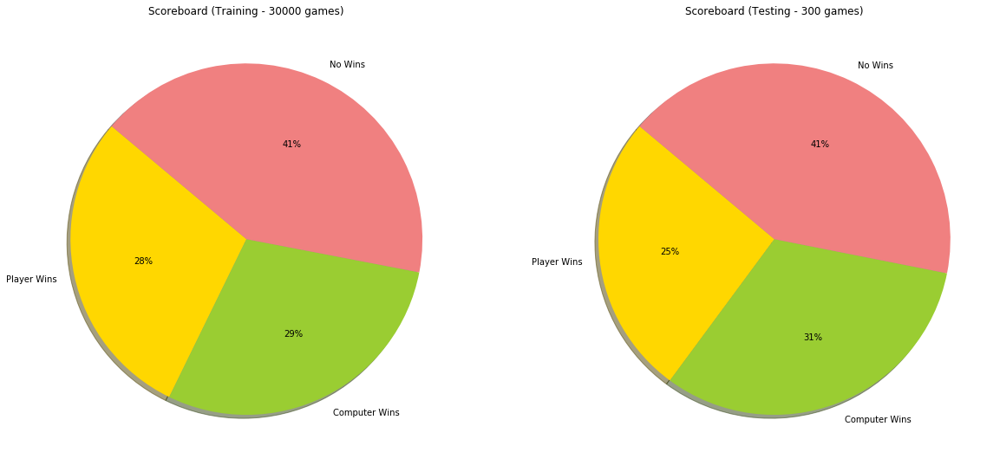

In [20]:
labels = 'Player Wins', 'Computer Wins', 'No Wins'
sizes_training = [no_of_games_won_by_player_training, no_of_games_won_by_computer_training, no_of_games_won_by_noone_training]
sizes_testing = [no_of_games_won_by_player_testing, no_of_games_won_by_computer_testing, no_of_games_won_by_noone_testing]
colors = ['gold', 'yellowgreen', 'lightcoral']

fig = plt.figure(0, (20, 10))

plt.subplot(1, 2, 1)
plt.pie(sizes_training, labels=labels, colors=colors,autopct='%1.1d%%', shadow=True, startangle=140)
plt.title("Scoreboard (Training - {} games)".format(no_of_games_to_play))

plt.subplot(1, 2, 2)
plt.pie(sizes_testing, labels=labels, colors=colors,autopct='%1.1d%%', shadow=True, startangle=140)
plt.title("Scoreboard (Testing - {} games)".format(no_of_games))

# plt.savefig('004.png')

plt.show()

### NOTE:

Since it takes a long time to run the traning agent and generate useful plots I have taken screenshots and have shown those for my observations (as discussed with the professor)

### Observation 1


alpha = 0.4

epsilon = 0.9

gamma = 0.3

![title](001.png)

### Observation 2

alpha = 0.6

epsilon = 1.0

gamma = 0.5

<img src="002.png">

This plots the rewards tracked as the game progresses and is done for both training and testing.

We can see the distribution of the game play between the player and the computer as it shows positive moves recorded as spikes in the graph.

I have set an upper limit to show the grpah since it will be really difficult to track all the thousands of games played during traning

NO such reservations are held during traning since I am traning on a small number of games

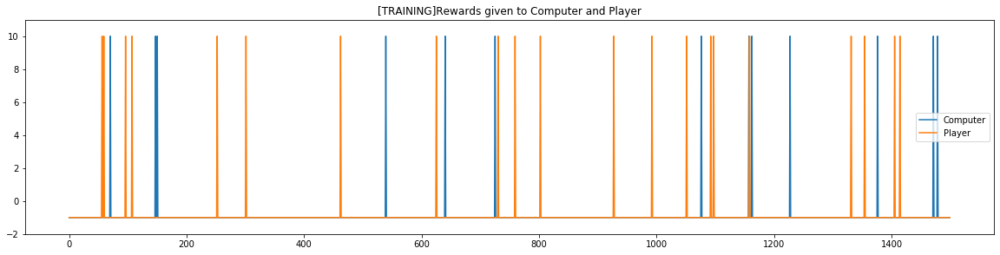

In [21]:
# agent.rewards_list_comp
upper_limit_for_graph = 1500
fig = plt.figure(0, (20, 10))
ax1 = plt.subplot(211)
plt.plot(agent.rewards_list_comp[:1500], label="Computer")
plt.plot(agent.rewards_list_player[:1500], label="Player")
ax1.set_ylim([-2, 11])
plt.title("[TRAINING]Rewards given to Computer and Player")
plt.legend()
#plt.savefig('005.png')
plt.show()

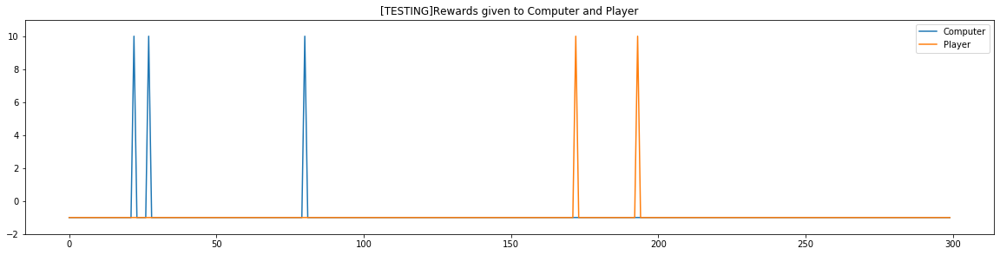

In [22]:
# agent.rewards_list_comp
upper_limit_for_graph = no_of_games
fig = plt.figure(0, (20, 10))
ax2 = plt.subplot(212)
plt.plot(agent.rewards_list_comp_test[:upper_limit_for_graph], label="Computer")
plt.plot(agent.rewards_list_player_test[:upper_limit_for_graph], label="Player")
ax2.set_ylim([-2, 11])
plt.title("[TESTING]Rewards given to Computer and Player")
plt.legend()
# plt.savefig('006.png')
plt.show()

#### NOTE:

As discussed before, the following plots are screenshots taken fomr actual observation to avoid having to run this notebook form scratch.

### Observation 1 (TRAINING)

alpha = 0.4

epsilon = 0.9

gamma = 0.3

<img src="005.png">

### Observation 1 (TESTING)

alpha = 0.4

epsilon = 0.9

gamma = 0.3

<img src="006.png">

# V. Conclusions

Discuss the challenges or somethat that you learned. 
If you have any suggestion about the assignment, you can write about it. 

This has by far been one of the most challenging assignments in this course. One of my first challenges was understanding the rules that govern rummy in the first place.

The other challenge was deciding how the Q table would look. I faced several problems when facing this challenge and it took a better part of the week trying to figure this out. Overall the challenge was really helpful. One of my big takeawaays form this challenge is how tuning the hyper parameters can have an impact on the final scoreboard.

What really bugged me though was that the toughest challenge was set in the last week of November leaving the majority of us with little to no time to work on the project. I hope this is taken into consideration when teaching the next class

### References

1. Open AI GYM Documentation, https://gym.openai.com/docs/

2. OpenAI Gym and Python for Q-learning - Reinforcement Learning Code Project, Youtube, https://www.youtube.com/watch?v=QK_PP_2KgGE&list=PLZbbT5o_s2xoWNVdDudn51XM8lOuZ_Njv&index=8

3. Reinforcement Learning - Solving Blackjack, Medium, https://towardsdatascience.com/reinforcement-learning-solving-blackjack-5e31a7fb371f

4. Teaching a Computer, Curious Coder, https://curiouscoder.space/blog/machine%20learning/teaching-a-computer-blackjack-using-reinforcement-learning/

5. Professors Notes, https://nbviewer.jupyter.org/url/webpages.uncc.edu/mlee173/teach/itcs6156/notebooks/notes/Note-NN%20for%20RL.ipynb

# Extra Credit for Tournament Top16!

- In two classes, we will have qualification and tournament.
- To participate the tournament, you need to use this [client](http://nbviewer.jupyter.org/url/webpages.uncc.edu/mlee173/teach/itcs6156/notebooks/assign/StudentClient.ipynb) codes.
- Locally you can run the [server](http://nbviewer.jupyter.org/url/webpages.uncc.edu/mlee173/teach/itcs6156/notebooks/assign/SERVER.ipynb) to verify your run. 

### Qualification Round 

- In qualification game, individual will play against a fixed policy agent on the server
  - You can access the server: TBA
  
  - Highly ranked (by the profit) will proceed to the tournament.
  - max. 32 players will be cut for main tournament (by 11 pm on Dec 1st).
  
### Tournament

- In tournament, 4 players will be play in each round.
  - In a table game, two best scoring players will proceed to next round
  - In final, the game will ends in 50 rounds and winner will be the one with lowest balance. 

## Grading

We will test your notebook with an additional grid.txt file. Please make sure to test in different maze input files. 

points | | description
--|--|:--
5 | Overview| states the objective and the appraoch 
35 | Methods | 
 |10| Review of the SARSA and Q-Learning
 | 5| Choice of TD learning and Reason
 | 5| Choice of Function Approximation and Reason
 |10| Implementation of the selected approach (RLAgent)
 | 5| explanation of the codes
45 | Results 
 |10| Reports the selected parameters 
 |15| Experimental outputs that show the choice of parameters. How do you choose them?
 |10| Output plots (5 for each)
 |10| reading and analysis of learning results and plots
10 | Participation to the tournament.
5 | Conclusions 
